<a href="https://colab.research.google.com/github/niteshchoudhary12445/Computer_vision_project/blob/main/Food_vision_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!wget https://raw.githubusercontent.com/niteshchoudhary12445/Computer_vision_project/main/helper_function.py

--2024-08-09 17:43:26--  https://raw.githubusercontent.com/niteshchoudhary12445/Computer_vision_project/main/helper_function.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7652 (7.5K) [text/plain]
Saving to: ‘helper_function.py’

helper_function.py  100%[===================>]   7.47K  --.-KB/s    in 0s      

2024-08-09 17:43:26 (122 MB/s) - ‘helper_function.py’ saved [7652/7652]



In [2]:
from helper_function import create_tensorboard_callback, plot_loss_curves, make_confusion_matrix

In [3]:
# Dataset from tensorflow dataset
import tensorflow_datasets as tfds
import tensorflow as tf

In [5]:
# List all available datasets
datasets_list = tfds.list_builders()  # get the available datasets in tfds
print("food101" in datasets_list) # Checking the dataset we want is available in tensorflow datasets

True


In [6]:
# Load in the data
(train_data, test_data), ds_info = tfds.load(name="food101",split=["train","validation"],shuffle_files=True,as_supervised=True,with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/75750 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/incomplete.627XIO_2.0.0/food101-train.tfrecord*...:   0%|         …

Generating validation examples...:   0%|          | 0/25250 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/incomplete.627XIO_2.0.0/food101-validation.tfrecord*...:   0%|    …

Dataset food101 downloaded and prepared to /root/tensorflow_datasets/food101/2.0.0. Subsequent calls will reuse this data.


In [7]:
# Features of Food101 from TFDS
ds_info.features

FeaturesDict({
    'image': Image(shape=(None, None, 3), dtype=uint8),
    'label': ClassLabel(shape=(), dtype=int64, num_classes=101),
})

In [8]:
# Get the class names
class_names = ds_info.features["label"].names
class_names[:10]

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito']

In [9]:
# Take one sample of the train data
train_one_sample = train_data.take(1)
train_one_sample

<_TakeDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [10]:
# output info about our training sample
for image,label in train_one_sample:
  print(f"""
  Image shape : {image.shape}
  Image datatype: {image.dtype}
  Target class from Food101: {label}
  Class name: {class_names[label.numpy()]}""")


  Image shape : (512, 512, 3)
  Image datatype: <dtype: 'uint8'>
  Target class from Food101: 31
  Class name: donuts


In [11]:
# What are the min and max values of our image tensor
tf.reduce_min(image),tf.reduce_max(image)

(<tf.Tensor: shape=(), dtype=uint8, numpy=0>,
 <tf.Tensor: shape=(), dtype=uint8, numpy=255>)

(-0.5, 511.5, 511.5, -0.5)

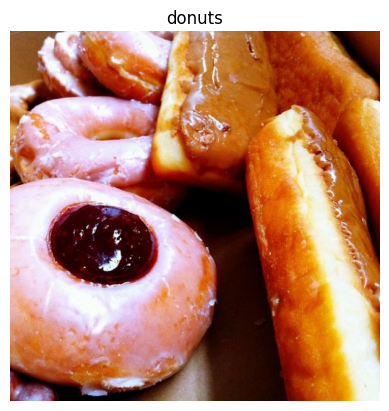

In [12]:
# Plot the image tensor
import matplotlib.pyplot as plt
plt.imshow(image)
plt.title(class_names[label.numpy()])
plt.axis(False)

In [13]:
def preprocessing_function(image, label, img_shape=224):
    """
    Preprocesses an image and its corresponding label for input into a model.

    This function resizes the input image to a specified shape and converts
    the image to a float32 data type. The label is returned unchanged.

    Args:
        image (tf.Tensor): The input image as a TensorFlow tensor.
        label (Any): The label corresponding to the image. It can be any type.
        img_shape (int, optional): The desired size to which the image will be
                                   resized. The image is resized to a square
                                   of shape (img_shape, img_shape).
                                   Defaults to 224.

    Returns:
        (tf.Tensor, Any): A tuple containing:
            - The preprocessed image tensor, resized and cast to tf.float32.
            - The original label, unchanged.
    """
    image = tf.image.resize(image, [img_shape, img_shape])
    return tf.cast(image, tf.float32), label

In [14]:
# Preprocessing the image
preprocessed_img=preprocessing_function(image,label)[0]

In [15]:
preprocessed_img[0]

<tf.Tensor: shape=(224, 3), dtype=float32, numpy=
array([[1.34030609e+02, 8.90306168e+01, 5.80306129e+01],
       [1.36045914e+02, 9.10459213e+01, 6.00459175e+01],
       [1.37846939e+02, 9.28469391e+01, 6.38469391e+01],
       [1.43321426e+02, 9.83214264e+01, 6.93214264e+01],
       [1.46051025e+02, 1.00770409e+02, 7.26122437e+01],
       [1.44581635e+02, 9.86275482e+01, 7.24897919e+01],
       [1.44852036e+02, 9.92091827e+01, 7.14234619e+01],
       [1.35867340e+02, 8.77397919e+01, 5.08367310e+01],
       [1.37413269e+02, 9.03418350e+01, 4.84846954e+01],
       [1.31209183e+02, 8.42091827e+01, 3.92193832e+01],
       [1.33857162e+02, 8.73571548e+01, 3.98571625e+01],
       [1.35290817e+02, 8.82908173e+01, 4.54336777e+01],
       [1.32214294e+02, 8.42142868e+01, 4.63571434e+01],
       [1.30928574e+02, 8.19285736e+01, 4.91581650e+01],
       [1.28127548e+02, 8.31275558e+01, 4.28418312e+01],
       [1.31387756e+02, 8.45969391e+01, 4.61938820e+01],
       [1.34362244e+02, 8.43622437e+01

In [16]:
train_data

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, None, 3), dtype=tf.uint8, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

In [17]:
# Apply preprocessing_function to each element in train_data and test_data with parallel processing.
train_data = train_data.map(map_func=preprocessing_function,num_parallel_calls=tf.data.AUTOTUNE)
test_data = test_data.map(map_func=preprocessing_function,num_parallel_calls=tf.data.AUTOTUNE)

In [18]:
# Shuffling and turning data into batches
train_data=train_data.shuffle(buffer_size=1000).batch(batch_size=32).prefetch(buffer_size=tf.data.AUTOTUNE)

In [19]:
test_data = test_data.batch(32).prefetch(tf.data.AUTOTUNE)

In [20]:
# creating modelling callbacks
checkpoint_path="model_checkpoint/cp.weights.h5"
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,monitor="val_acc",save_best_only=True,save_weights_only=True)

In [ ]:
from tensorflow.keras import mixed_precision
mixed_precision.set_global_policy("mixed_float16")

In [22]:
# Building the model
base_model=tf.keras.applications.EfficientNetV2B0(include_top=False)
base_model.trainable=False
inputs=tf.keras.layers.Input(shape=(224,224,3),name="Input_layers")
x=base_model(inputs,training=False)
x=tf.keras.layers.GlobalAveragePooling2D()(x)
outputs=tf.keras.layers.Dense(len(class_names),activation="softmax")(x)
model = tf.keras.Model(inputs,outputs)

24274472/24274472 [==============================] - 0s 0us/step


In [23]:
# Compiling the model
model.compile(loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              optimizer=tf.keras.optimizers.Adam(),
              metrics=["accuracy"])

In [24]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 Input_layers (InputLayer)   [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b0 (Functio  (None, None, None, 1280   5919312   
 nal)                        )                                   
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 101)               129381    
                                                                 
Total params: 6048693 (23.07 MB)
Trainable params: 129381 (505.39 KB)
Non-trainable params: 5919312 (22.58 MB)
_________________________________________________________________


In [25]:
history_1=model.fit(train_data,epochs=3,validation_data=test_data,validation_steps=int(0.25*len(test_data)),callbacks=[create_tensorboard_callback(dir_name="Model_training",experiment_name="efficientnetb0_training_with_5_epochs"),model_checkpoint])

Saving TensorBoard log files to: Model_training/efficientnetb0_training_with_5_epochs/20240809-175152
Epoch 1/3
2368/2368 [==============================] - ETA: 0s - loss: 1.7461 - accuracy: 0.5768

2368/2368 [==============================] - 791s 331ms/step - loss: 1.7461 - accuracy: 0.5768 - val_loss: 1.1506 - val_accuracy: 0.6978
Epoch 2/3
2368/2368 [==============================] - ETA: 0s - loss: 1.2117 - accuracy: 0.6856

2368/2368 [==============================] - 768s 324ms/step - loss: 1.2117 - accuracy: 0.6856 - val_loss: 1.0421 - val_accuracy: 0.7237
Epoch 3/3
2368/2368 [==============================] - ETA: 0s - loss: 1.0635 - accuracy: 0.7219

2368/2368 [==============================] - 758s 320ms/step - loss: 1.0635 - accuracy: 0.7219 - val_loss: 0.9936 - val_accuracy: 0.7324


In [26]:
result = model.evaluate(test_data)

790/790 [==============================] - 227s 287ms/step - loss: 0.9918 - accuracy: 0.7291


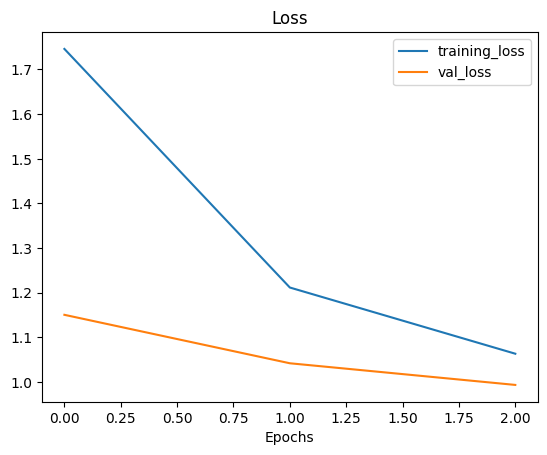

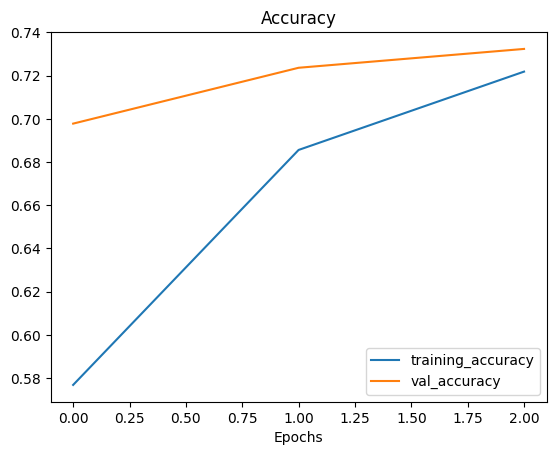

In [27]:
plot_loss_curves(history_1)

In [28]:
pred = model.predict(test_data)

790/790 [==============================] - 228s 287ms/step


In [29]:
y_labels = []

# Unbatch the dataset and extract labels
for image, label in test_data.unbatch():
    y_labels.append(label.numpy())

In [30]:
y_labels[:10]

[65, 70, 34, 69, 23, 78, 13, 41, 27, 41]

In [31]:
import numpy as np
y_pred=np.argmax(pred, axis=-1)

In [32]:
y_pred[:10]

array([24, 48, 79, 15, 81, 26, 27, 47, 80, 21])

In [33]:
make_confusion_matrix(y_labels,y_pred,classes=class_names,
                      figsize=(100, 100),
                      text_size=20)

In [34]:
%load_ext tensorboard

In [35]:
%tensorboard --logdir /content/Model_training

<IPython.core.display.Javascript object>

In [ ]:
model.save("Foodvision_model.keras")